<a href="https://colab.research.google.com/github/AndrzejOlejniczak/PORTFOLIO/blob/main/BERI001_01_Semantic_segmentation_of_aerial_images_using_U_Net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BERI_001 - Mapping Informal Green Spaces
### Notebook 01: Semantic segmentation of aerial images using U-Net.
<p> This notebook presents a first take on semantic segmentation.

1. Prepare environment and download the data.
2. Create datasets.
3. Build the model.

References:
<p> https://www.youtube.com/watch?v=jvZm8REF2KY&t=534s
<p> Data: https://www.kaggle.com/datasets/humansintheloop/semantic-segmentation-of-aerial-imagery



# 1. Prepare environment and download the data.

## 1.1. Prepare the envrionment to work directly with Kaggle dataset

In [ ]:
!pip install opendatasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import opendatasets as od

## 1.2. Download the data

In [ ]:
od.download(
    'https://www.kaggle.com/datasets/humansintheloop/semantic-segmentation-of-aerial-imagery'
)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: andrzejolejniczak
Your Kaggle Key: ··········


100%|██████████| 29.6M/29.6M [00:02<00:00, 12.8MB/s]


## 1.3. Inspect the data

In [ ]:
example_data_path = '/content/semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 1'

In [ ]:
example_images = '/images'
example_masks = '/masks'

In [ ]:
import os
import matplotlib.pyplot as plt

In [ ]:
example_data_path + example_images

'/content/semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset/Tile 1/images'

('image_part_001.jpg', 'image_part_001.png')


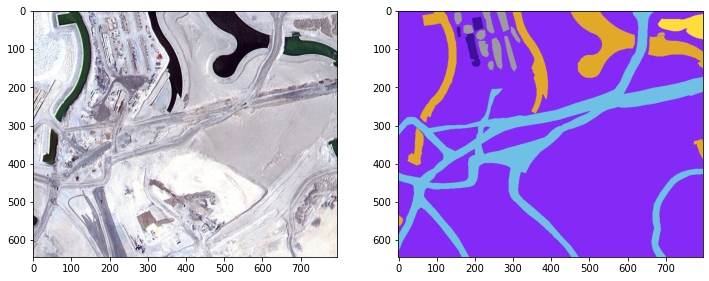

('image_part_002.jpg', 'image_part_002.png')


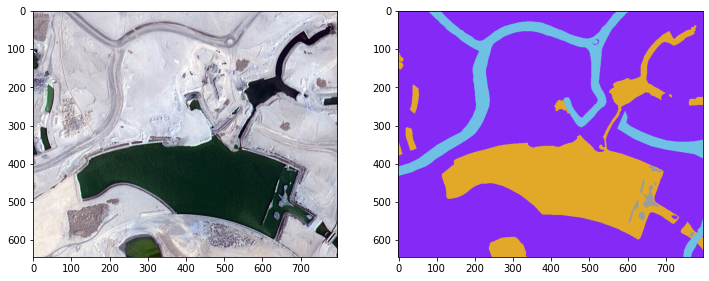

('image_part_003.jpg', 'image_part_003.png')


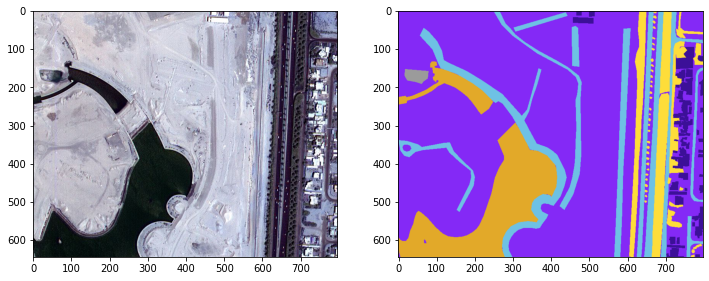

('image_part_004.jpg', 'image_part_004.png')


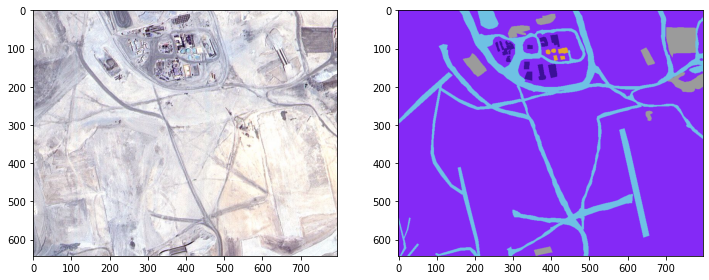

('image_part_005.jpg', 'image_part_005.png')


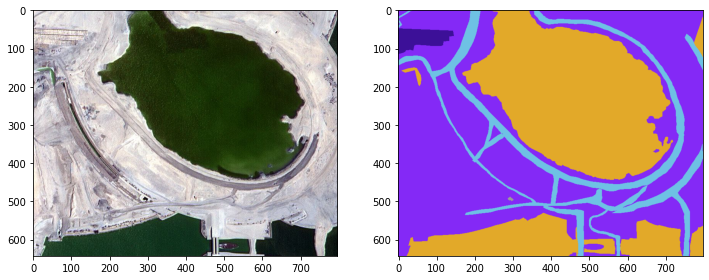

('image_part_006.jpg', 'image_part_006.png')


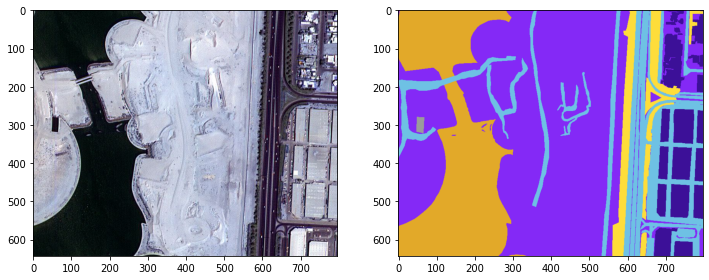

('image_part_007.jpg', 'image_part_007.png')


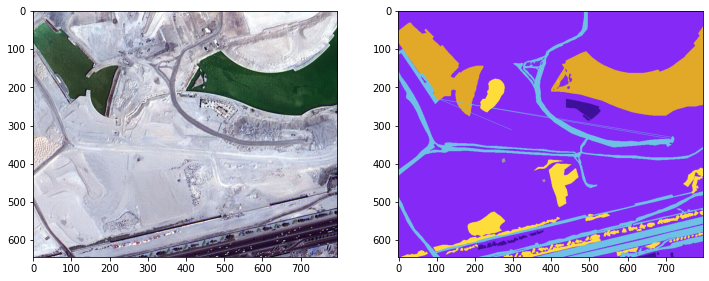

('image_part_008.jpg', 'image_part_008.png')


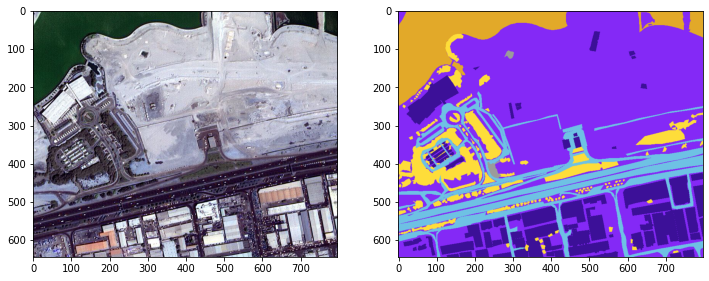

('image_part_009.jpg', 'image_part_009.png')


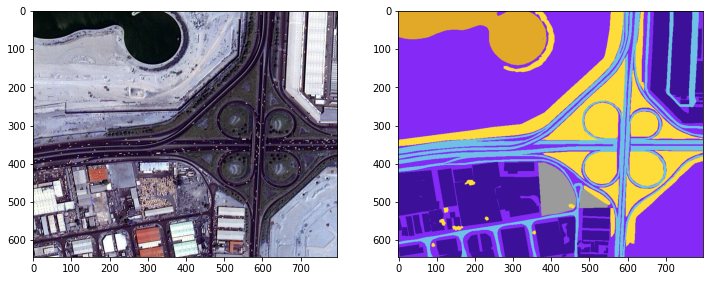

In [ ]:
for image in zip(sorted(os.listdir(example_data_path + example_images)), sorted(os.listdir(example_data_path + example_masks))):
  print(image)
  img = plt.imread(os.path.join(example_data_path + example_images, image[0]))
  mask = plt.imread(os.path.join(example_data_path + example_masks, image[1]))
  fig, (ax1, ax2) = plt.subplots(1, 2)
  fig.set_size_inches(12, 25)
  ax1.imshow(img)
  ax2.imshow(mask)
  plt.show()


# 2. Create datasets

The dataset consists of aerial imagery of Dubai obtained by MBRSC satellites and annotated with pixel-wise semantic segmentation in 6 classes. The total volume of the dataset is 72 images grouped into 6 larger tiles. The classes are:

Building: #3C1098
Land (unpaved area): #8429F6
Road: #6EC1E4
Vegetation: #FEDD3A
Water: #E2A929
Unlabeled: #9B9B9B

Following the idea of DigitalSreeni (https://github.com/bnsreenu/python_for_microscopists/blob/master/228_semantic_segmentation_of_aerial_imagery_using_unet/228_training_aerial_imagery.py) we are going to use patchify to divide kaggle data into digestable patches

## 2.1. Slice images and mask into pathes

In [ ]:
!pip install patchify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install segmentation_models

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install keras==2.3.1
!pip install tensorflow==2.1.0
!pip install keras_applications==1.0.8
!pip install image-classifiers==1.0.0
!pip install efficientnet==1.0.0

In [ ]:
# Import necessary modules
import os
import cv2
import numpy as np
import tensorflow as tf
from patchify import patchify
from PIL import Image
%env SM_FRAMEWORK=tf.keras
import segmentation_models
from tensorflow.keras.metrics import MeanIoU
from sklearn.preprocessing import MinMaxScaler, StandardScaler

env: SM_FRAMEWORK=tf.keras


In [ ]:
root_dir = '/content/semantic-segmentation-of-aerial-imagery/Semantic segmentation dataset'
patch_size = 256

The main idea here is to divide given images into (256, 256, 3) patches.

This way we will preserve spatial information wich would be lost with reascaling and other standard data augmentation operations that scale the input.

Unlike DigitalSreeni we will use however RandomFlip, which preserves spatial features of objects and relations between them.

Of course the downside of such cropping is: You lose some of the information, but since the data lack geolocalization it is a good intuition that this information loss is negligible.

In [ ]:
# Create a list of numpy arrays
image_dataset = []

In [ ]:
# Iterate through images, crop them to divisible by patch_size size and slice them into patches
for path, subdirs, files in os.walk(root_dir):
  dirname = path.split(os.path.sep)[-1]
  if dirname == 'images':
    images = sorted(os.listdir(path)) #List all image filenames
    for i, image_name in enumerate(images):
      if image_name.endswith('.jpg'): # Aerial images are in .jpg format

        image = cv2.imread(path +'/'+image_name, 1) # read each image as BGR

        # Compute the size of image divisible by patch_size
        size_X = (image.shape[1]//patch_size) * patch_size
        size_Y = (image.shape[0]//patch_size) * patch_size
        # Transorm loaded image to PIL Image object
        image = Image.fromarray(image)
        # Crop the image,
        image = image.crop((0, 0, size_X, size_Y))
        # Go back to an array
        image = np.array(image)

        # Slice the image without overlap
        print('patchyfying image: ', image_name)
        patches_img = patchify(image, (patch_size, patch_size, 3), step=patch_size)

        for i in range(patches_img.shape[0]):
          for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i, j, :, :,]
            single_patch_img = single_patch_img[0]
            image_dataset.append(single_patch_img)

patchyfying image:  image_part_001.jpg
patchyfying image:  image_part_002.jpg
patchyfying image:  image_part_003.jpg
patchyfying image:  image_part_004.jpg
patchyfying image:  image_part_005.jpg
patchyfying image:  image_part_006.jpg
patchyfying image:  image_part_007.jpg
patchyfying image:  image_part_008.jpg
patchyfying image:  image_part_009.jpg
patchyfying image:  image_part_001.jpg
patchyfying image:  image_part_002.jpg
patchyfying image:  image_part_003.jpg
patchyfying image:  image_part_004.jpg
patchyfying image:  image_part_005.jpg
patchyfying image:  image_part_006.jpg
patchyfying image:  image_part_007.jpg
patchyfying image:  image_part_008.jpg
patchyfying image:  image_part_009.jpg
patchyfying image:  image_part_001.jpg
patchyfying image:  image_part_002.jpg
patchyfying image:  image_part_003.jpg
patchyfying image:  image_part_004.jpg
patchyfying image:  image_part_005.jpg
patchyfying image:  image_part_006.jpg
patchyfying image:  image_part_007.jpg
patchyfying image:  image

In [ ]:
len(image_dataset)

1305

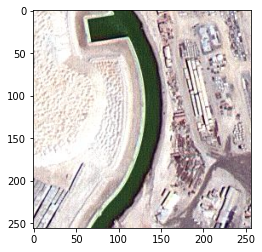

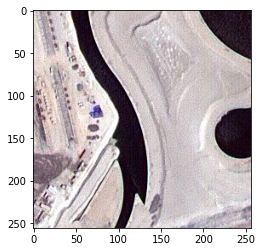

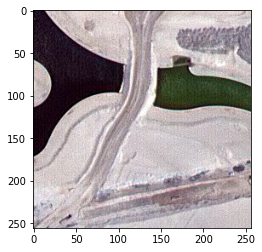

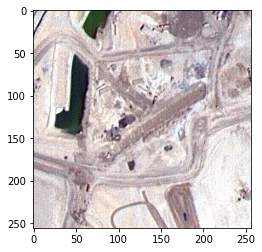

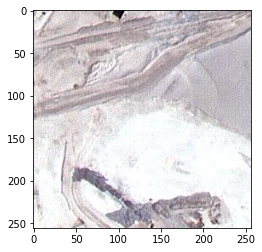

In [ ]:
# Inspect patchified dataset
for image in image_dataset[:5]:
  plt.imshow(image)
  plt.show()

In [ ]:
# Create an empty list for numpy arrays
mask_dataset = []
for path, subdirs, files in os.walk(root_dir):
  dirname = path.split(os.path.sep)[-1]
  if dirname == 'masks':
    masks = sorted(os.listdir(path))
    for i, mask_name in enumerate(masks):
      if mask_name.endswith('.png'):

        mask = cv2.imread(path + '/' + mask_name, 1)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        size_X = (mask.shape[1]//patch_size)*patch_size
        size_Y = (mask.shape[0]//patch_size)*patch_size
        mask = Image.fromarray(mask)
        mask = mask.crop((0, 0, size_X, size_Y))
        mask = np.array(mask)

        print('patchyfying mask: ', mask_name)
        patches_mask = patchify(mask, (patch_size, patch_size, 3), step=patch_size)

        for i in range(patches_mask.shape[0]):
          for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i, j, :, :]
            single_patch_mask = single_patch_mask[0]

            mask_dataset.append(single_patch_mask)

patchyfying mask:  image_part_001.png
patchyfying mask:  image_part_002.png
patchyfying mask:  image_part_003.png
patchyfying mask:  image_part_004.png
patchyfying mask:  image_part_005.png
patchyfying mask:  image_part_006.png
patchyfying mask:  image_part_007.png
patchyfying mask:  image_part_008.png
patchyfying mask:  image_part_009.png
patchyfying mask:  image_part_001.png
patchyfying mask:  image_part_002.png
patchyfying mask:  image_part_003.png
patchyfying mask:  image_part_004.png
patchyfying mask:  image_part_005.png
patchyfying mask:  image_part_006.png
patchyfying mask:  image_part_007.png
patchyfying mask:  image_part_008.png
patchyfying mask:  image_part_009.png
patchyfying mask:  image_part_001.png
patchyfying mask:  image_part_002.png
patchyfying mask:  image_part_003.png
patchyfying mask:  image_part_004.png
patchyfying mask:  image_part_005.png
patchyfying mask:  image_part_006.png
patchyfying mask:  image_part_007.png
patchyfying mask:  image_part_008.png
patchyfying 

In [ ]:
len(mask_dataset)

1305

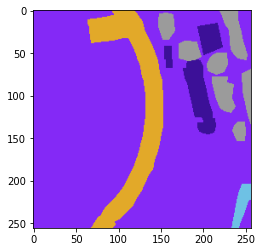

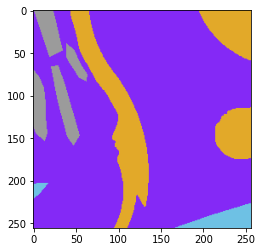

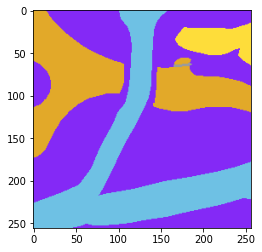

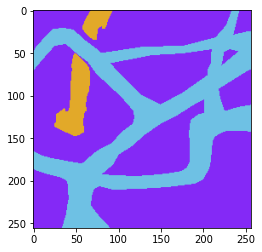

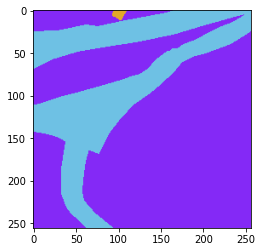

In [ ]:
for image in mask_dataset[:5]:
  plt.imshow(image)
  plt.show()

In [ ]:
# Save datsets as numpy arrays
image_dataset = np.array(image_dataset)
mask_dataset = np.array(mask_dataset)

image_dataset.shape, mask_dataset.shape

((1305, 256, 256, 3), (1305, 256, 256, 3))

**Looks like sorted() function did the trick of ordering patches and masks accordingly. Let's check this using random trials...**

In [ ]:
import random

In [ ]:
def get_random_sample_pair(dataset1, dataset2, return_imgs=False):
  number = random.randint(0, len(dataset1))
  plt.figure(figsize=(12,6))
  plt.subplot(121)
  plt.imshow(dataset1[number])
  plt.subplot(122)
  plt.imshow(dataset2[number])
  plt.show()
  if return_imgs:
    return dataset1[number], dataset2[number]

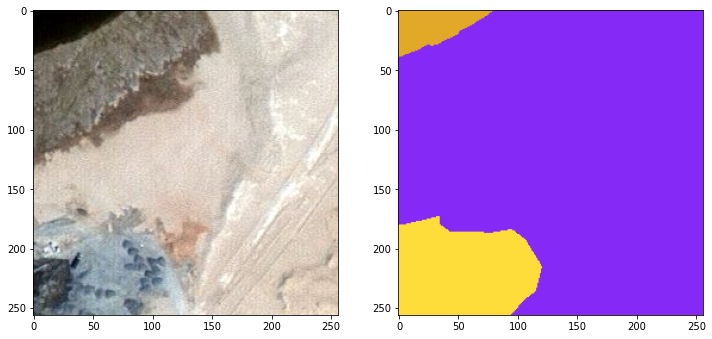

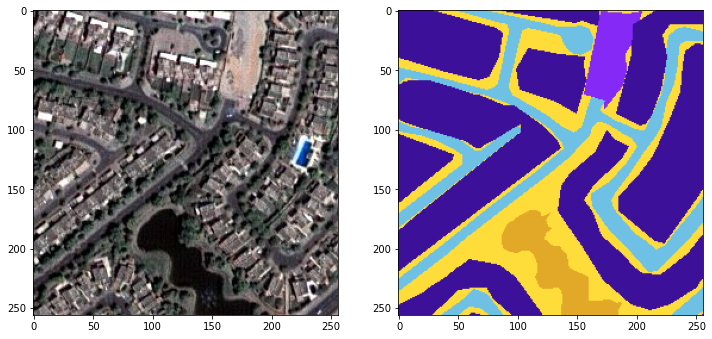

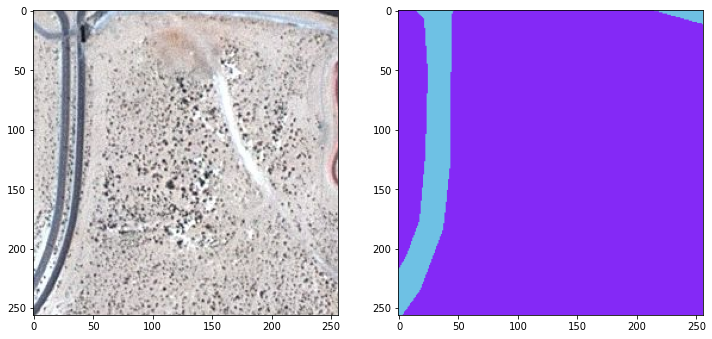

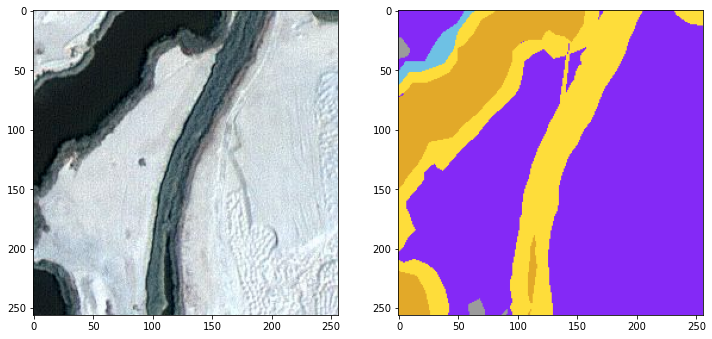

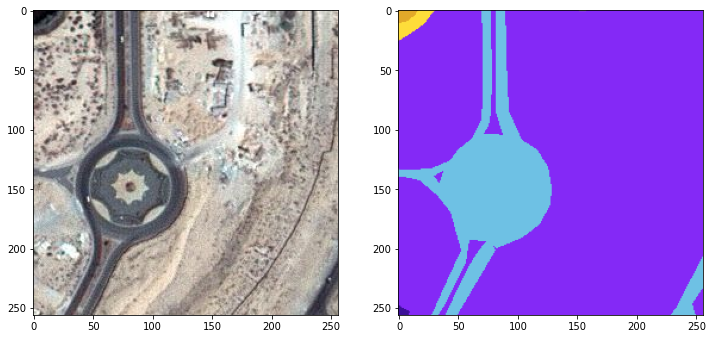

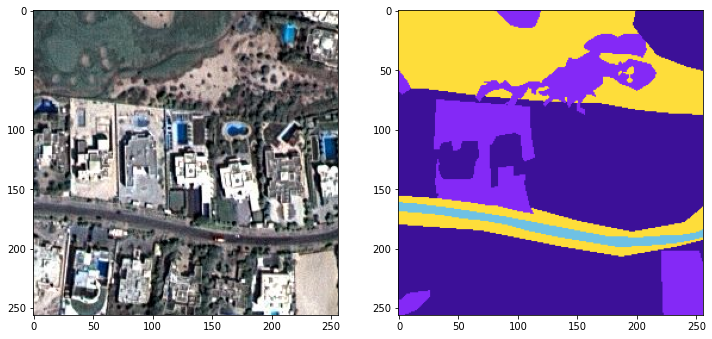

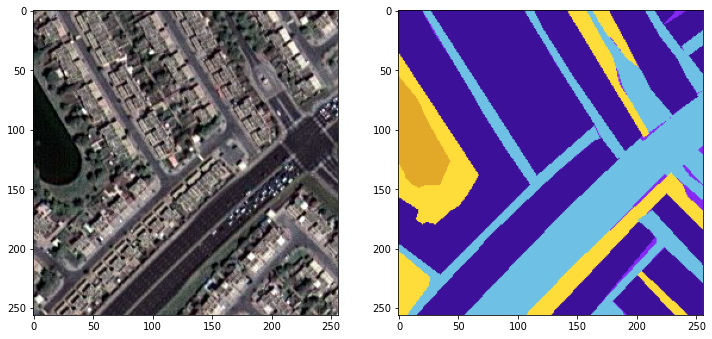

In [ ]:
list_of_pairs = []
for i in range(7):
  list_of_pairs.append((get_random_sample_pair(image_dataset, mask_dataset, return_imgs=True)))

In [ ]:
import pandas as pd

## 2.2. Create categorical labels from masks
These are categories and annotation colors:

*   Building: #3C1098
*   Land (unpaved area): #8429F6
*   Road: #6EC1E4
*   Vegetation: #FEDD3A
*   Water: #E2A929
*   Unlabeled: #9B9B9B

#### And before that check, if kaggle information about the colors is accurate?
(Some functions belowe thanks to https://www.educative.io/answers/how-to-convert-hex-to-rgb-and-rgb-to-hex-in-python )

In [ ]:
# Extract unique
some_list = []
for it, el in enumerate(np.array(list_of_pairs)):
  for i in range(256):
    for j in range(256):
      if tuple(el[1][i,j,:]) not in some_list:
        some_list.append(tuple(el[1][i,j,:]))

In [ ]:
some_list

[(226, 169, 41),
 (132, 41, 246),
 (254, 221, 58),
 (60, 16, 152),
 (110, 193, 228),
 (155, 155, 155)]

In [ ]:
def rgb_to_hex(r, g, b):
  return ('{:X}{:X}{:X}').format(r, g, b)

In [ ]:
for some_color in some_list:
  print(rgb_to_hex(some_color[0], some_color[1], some_color[2]))

E2A929
8429F6
FEDD3A
3C1098
6EC1E4
9B9B9B


**Looks good, let's make a neat table.**

In [ ]:
def hex_to_rgb(hex):
  rgb = []
  for i in (0, 2, 4):
    decimal = int(hex[i:i+2], 16)
    rgb.append(decimal)

  return tuple(rgb)

In [ ]:
color_labels_table_df = pd.DataFrame({
  'Building': '3C1098',
  'Land (unpaved area)': '8429F6',
  'Road': '6EC1E4',
  'Vegetation': 'FEDD3A',
  'Water': 'E2A929',
  'Unlabeled': '9B9B9B'}, index = ['hex']
)

In [ ]:
color_labels_table_df = color_labels_table_df.transpose()

Let's make a neat table of it

In [ ]:
color_labels_table_df['rgb'] = color_labels_table_df['hex'].agg(hex_to_rgb)
color_labels_table_df

,hex,rgb
Building,3C1098,"(60, 16, 152)"
Land (unpaved area),8429F6,"(132, 41, 246)"
Road,6EC1E4,"(110, 193, 228)"
Vegetation,FEDD3A,"(254, 221, 58)"
Water,E2A929,"(226, 169, 41)"
Unlabeled,9B9B9B,"(155, 155, 155)"


**Let's add dummy vriable columns.** I want to preserve original order, so will not use pandas.get_dummies function. Instead I will np.fill_diagonal an np.zeros 6x6 array.

In [ ]:
six_per_six = np.zeros((6, 6))
np.fill_diagonal(six_per_six, 1)
six_per_six

array([[1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.]])

In [ ]:
# Create a dataframe and append it to existing color labels table
six_per_six_df = pd.DataFrame(six_per_six, dtype='int')
six_per_six_df.set_index(color_labels_table_df.index, inplace=True)

color_labels_table_df = pd.concat([color_labels_table_df, six_per_six_df], axis=1)

In [ ]:
color_labels_table_df

,hex,rgb,0,1,2,3,4,5
Building,3C1098,"(60, 16, 152)",1,0,0,0,0,0
Land (unpaved area),8429F6,"(132, 41, 246)",0,1,0,0,0,0
Road,6EC1E4,"(110, 193, 228)",0,0,1,0,0,0
Vegetation,FEDD3A,"(254, 221, 58)",0,0,0,1,0,0
Water,E2A929,"(226, 169, 41)",0,0,0,0,1,0
Unlabeled,9B9B9B,"(155, 155, 155)",0,0,0,0,0,1


In [ ]:
# Convert hex to RGB
Building = '#3C1098'.lstrip('#')
Building = np.array(tuple(int(Building[i:i+2], 16) for i in (0, 2, 4))) # 60, 16, 152

Land = '#8429F6'.lstrip('#')
Land = np.array(tuple(int(Land[i:i+2], 16) for i in (0, 2, 4))) #132, 41, 246

Road = '#6EC1E4'.lstrip('#')
Road = np.array(tuple(int(Road[i:i+2], 16) for i in (0, 2, 4))) #110, 193, 228

Vegetation =  'FEDD3A'.lstrip('#')
Vegetation = np.array(tuple(int(Vegetation[i:i+2], 16) for i in (0, 2, 4))) #254, 221, 58

Water = 'E2A929'.lstrip('#')
Water = np.array(tuple(int(Water[i:i+2], 16) for i in (0, 2, 4))) #226, 169, 41

Unlabeled = '#9B9B9B'.lstrip('#')
Unlabeled = np.array(tuple(int(Unlabeled[i:i+2], 16) for i in (0, 2, 4))) #155, 155, 155

In [ ]:
# Create a helper function creating labels
def rgb_to_2D_label(label):
    """
    Suply our labale masks as input in RGB format.
    Replace pixels with specific RGB values ...
    """
    label_seg = np.zeros(label.shape,dtype=np.uint8)
    label_seg [np.all(label == Building,axis=-1)] = 0
    label_seg [np.all(label==Land,axis=-1)] = 1
    label_seg [np.all(label==Road,axis=-1)] = 2
    label_seg [np.all(label==Vegetation,axis=-1)] = 3
    label_seg [np.all(label==Water,axis=-1)] = 4
    label_seg [np.all(label==Unlabeled,axis=-1)] = 5

    label_seg = label_seg[:,:,0]  #Just take the first channel, no need for all 3 channels
    return label_seg

In [ ]:
import seaborn as sns

In [ ]:
mask_dataset.shape

(1305, 256, 256, 3)

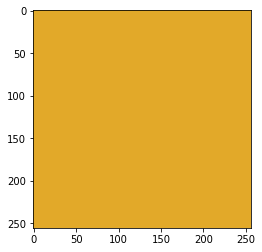

In [ ]:
plt.imshow(mask_dataset[1304])

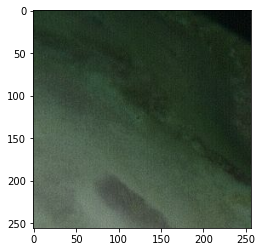

In [ ]:
plt.imshow(image_dataset[1304])

In [ ]:
labels = []

In [ ]:
for i in range(mask_dataset.shape[0]):
    label = rgb_to_2D_label(mask_dataset[i])
    labels.append(label)

In [ ]:
len(labels)

1305

In [ ]:
labels = np.array(labels)
labels.shape

(1305, 256, 256)

In [ ]:
labels = np.expand_dims(labels, axis=3)
labels.shape

(1305, 256, 256, 1)

#### Last time check: if image_dataset, mask_dataset and labels are corresponding.

In [ ]:
def get_random_sample_triple(dataset1, dataset2, dataset3, return_imgs=False):
  number = random.randint(0, len(dataset1))

  fig = plt.figure(figsize=(18,6))

  ax1 = fig.add_subplot(1, 3, 1)
  ax1.imshow(dataset1[number])

  ax2 = fig.add_subplot(1, 3, 2)
  ax2.imshow(dataset2[number])

  ax3 = fig.add_subplot(1, 3, 3)
  ax3 = sns.heatmap(dataset3[number], square=True, xticklabels=False, yticklabels=False, cbar=False)
  plt.show()
  if return_imgs:
    return dataset1[number], dataset2[number], dataset3[number]

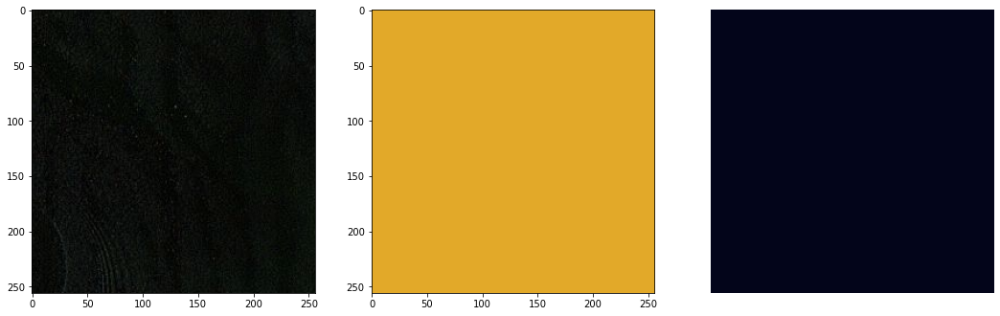

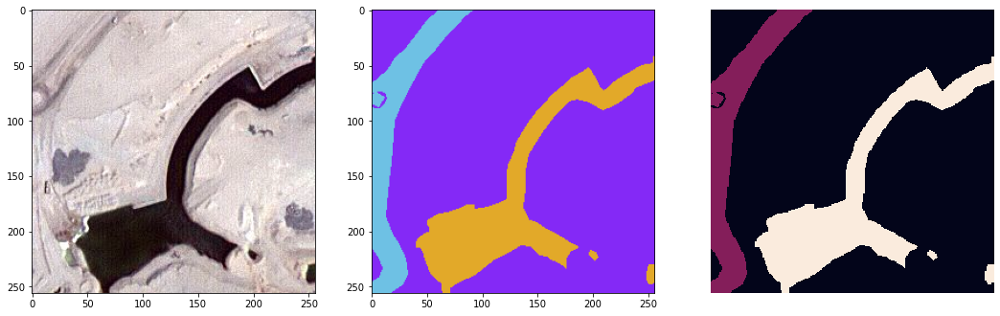

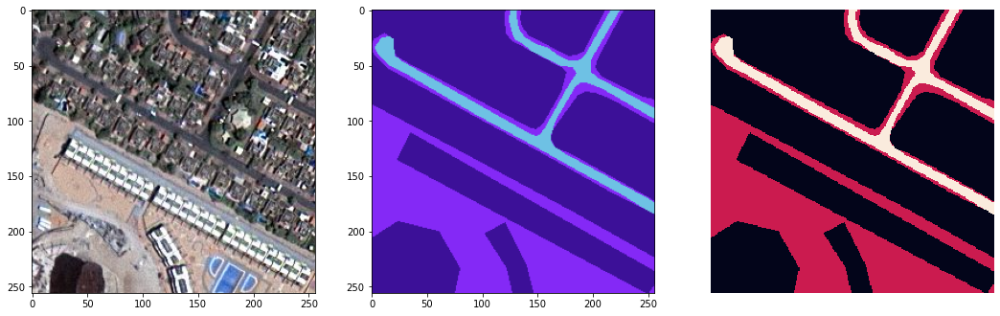

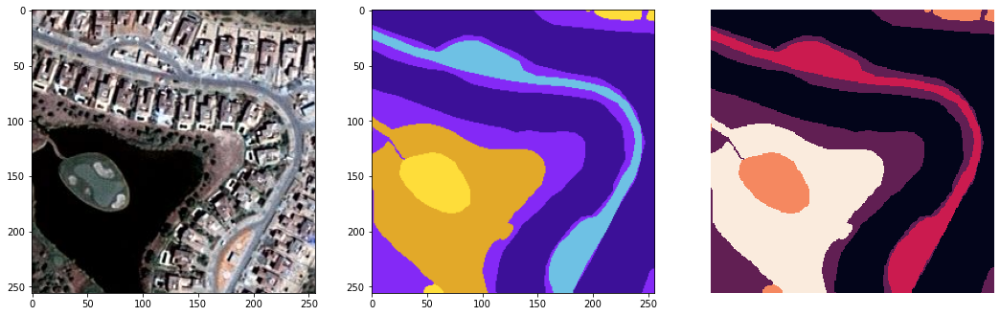

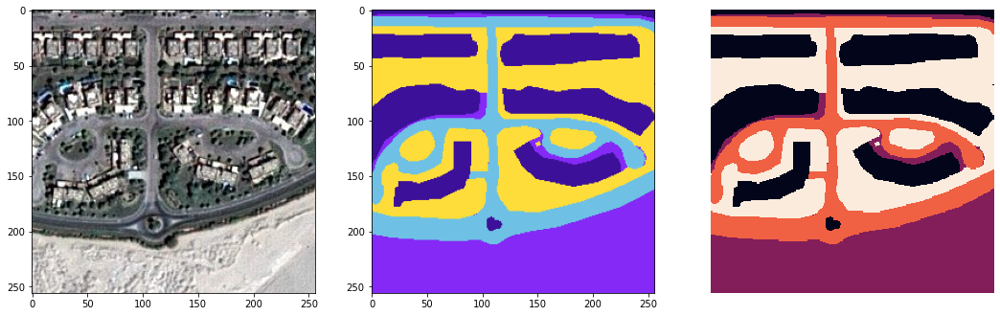

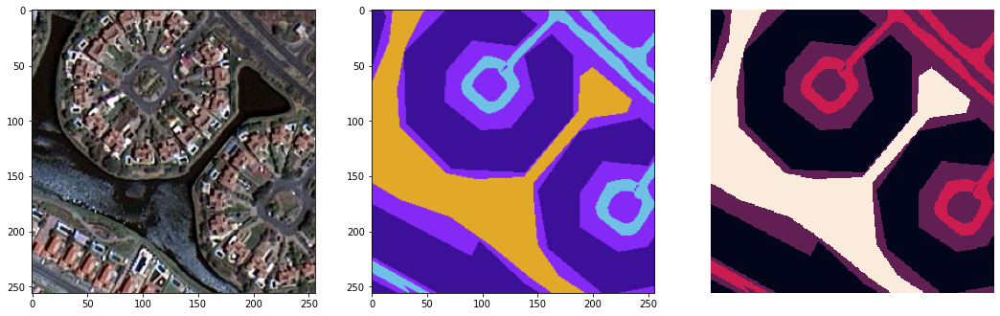

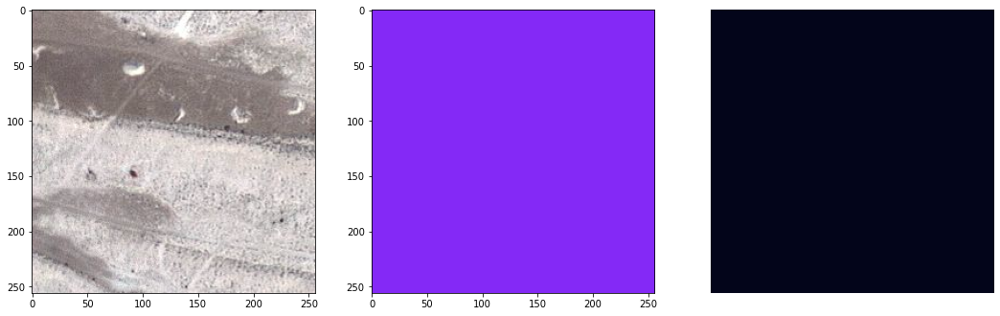

In [ ]:
list_of_threes = []
for i in range(7):
  list_of_threes.append((get_random_sample_triple(image_dataset, mask_dataset, np.squeeze(labels), return_imgs=True)))

In [ ]:
n_classes = len(np.unique(labels))
n_classes

6

In [ ]:
%%time
from tensorflow.keras.utils import to_categorical
labels_cat = to_categorical(labels, num_classes=n_classes)

CPU times: user 757 ms, sys: 998 ms, total: 1.75 s
Wall time: 1.75 s


In [ ]:
to_categorical(np.array([0, 1, 2, 3, 4, 5]))

array([[1., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1.]], dtype=float32)

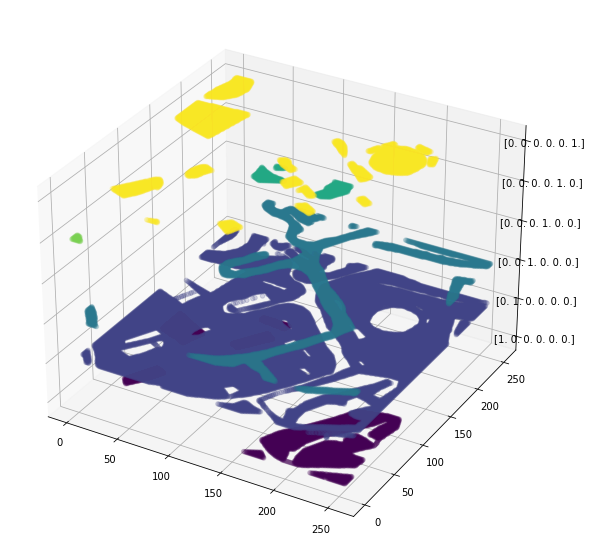

In [ ]:
plt.rcParams["figure.figsize"] = [10.00, 10.00]
plt.rcParams["figure.autolayout"] = True
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
data = labels_cat[77]
x, y, z = data.nonzero()
ax.set_zticks(
    ticks=np.array([0, 1, 2, 3, 4, 5]),
    )
ax.set_zticklabels(
    to_categorical(np.array([0, 1, 2, 3, 4, 5]))
)
ax.scatter(x,y,z, c=z, alpha=0.2)
plt.show()

## 2.3. Create test and train datasets

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(image_dataset,
                                                    labels_cat,
                                                    test_size=0.2,
                                                    random_state=44)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1044, 256, 256, 3),
 (261, 256, 256, 3),
 (1044, 256, 256, 6),
 (261, 256, 256, 6))

# 3. Create the model

## 3.1. Define the loss function

General overview of loss functions for semantic segmentation:
https://arxiv.org/abs/2006.14822

And some other bibliography:

https://fse.studenttheses.ub.rug.nl/18139/

https://arxiv.org/abs/1708.02002


In [ ]:
# Compute the weights for dice loss for later experimentation
from sklearn.utils.class_weight import compute_class_weight

weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(np.ravel(labels,order='C')),
    y=np.ravel(labels,order='C')
    )
print(weights)

[ 1.21840647  0.31278179  1.78506885  1.63018853  1.28221878 34.95017654]


In [ ]:
non_weights = [0.1666, 0.1666, 0.1666, 0.1666, 0.1666, 0.1666]

In [ ]:
dice_loss = segmentation_models.losses.DiceLoss(class_weights=non_weights)
focal_loss = segmentation_models.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1*focal_loss)

## 3.2. Create the baseline model

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from tensorflow.keras import backend as K

Code below to be found here: https://github.com/bnsreenu/python_for_microscopists/blob/master/228_semantic_segmentation_of_aerial_imagery_using_unet/simple_multi_unet_model.py

In [ ]:
# Define model creation function
def multi_unet_model(n_classes=6, img_h=256, img_w=256, img_ch=3, dropout_rate=0.2):
  inputs = Input((img_h, img_w, img_ch))
  # Image normalization
  s = Lambda(lambda x: x / 255)(inputs)

  # Contraction path
  c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(s)
  c1 = Dropout(dropout_rate)(c1)
  c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
  p1 = MaxPooling2D((2, 2))(c1)

  c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
  c2 = Dropout(dropout_rate)(c2)
  c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
  p2 = MaxPooling2D((2, 2))(c2)

  c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
  c3 = Dropout(dropout_rate)(c3)
  c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
  p3 = MaxPooling2D((2, 2))(c3)

  c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
  c4 = Dropout(dropout_rate)(c4)
  c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
  p4 = MaxPooling2D(pool_size=(2, 2))(c4)

  c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
  c5 = Dropout(0.3)(c5)
  c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

  # Expansive oath
  u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = concatenate([u6, c4])
  c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
  c6 = Dropout(dropout_rate)(c6)
  c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

  u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = concatenate([u7, c3])
  c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
  c7 = Dropout(dropout_rate)(c7)
  c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

  u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = concatenate([u8, c2])
  c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
  c8 = Dropout(0.1)(c8)
  c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

  u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = concatenate([u9, c1], axis=3)
  c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
  c9 = Dropout(0.1)(c9)
  c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

  outputs = Conv2D(n_classes, (1, 1), activation='softmax')(c9)

  model = Model(inputs=[inputs], outputs=[outputs])

  return model

In [ ]:
# Define intersection over union function
def jacard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

In [ ]:
X_train.shape

(1044, 256, 256, 3)

In [ ]:
# Create a model using helper function
model_0 = multi_unet_model(n_classes=n_classes,
                           img_h=X_train.shape[1],
                           img_w=X_train.shape[2],
                           img_ch=X_train.shape[3])

In [ ]:
model_0.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['lambda[0][0]']                 
                                )                                                                 
                                                                                              

In [ ]:
from tensorflow.keras.utils import plot_model

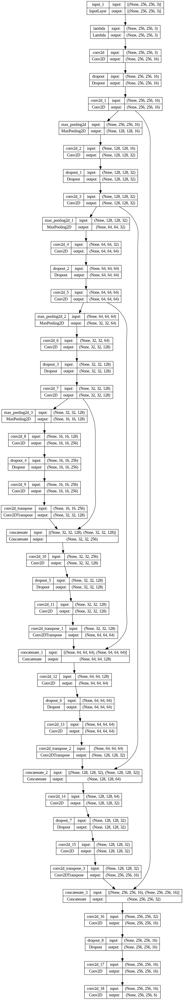

In [ ]:
plot_model(model_0, show_shapes=True)

In [ ]:
model_0.compile(loss=total_loss,
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy', jacard_coef])

In [ ]:
# Train the model and show time
%%time
history_0 = model_0.fit(
    X_train,
    y_train,
    batch_size=16,
    epochs=100,
    validation_data=(X_test, y_test),
    shuffle=False
)

Epoch 1/100
66/66 [==============================] - 5s 70ms/step - loss: 0.9870 - accuracy: 0.6143 - jacard_coef: 0.3217 - val_loss: 0.9764 - val_accuracy: 0.6838 - val_jacard_coef: 0.4689
Epoch 2/100
66/66 [==============================] - 3s 44ms/step - loss: 0.9546 - accuracy: 0.7258 - jacard_coef: 0.4692 - val_loss: 0.9515 - val_accuracy: 0.7484 - val_jacard_coef: 0.5295
Epoch 3/100
66/66 [==============================] - 3s 44ms/step - loss: 0.9427 - accuracy: 0.7641 - jacard_coef: 0.5250 - val_loss: 0.9410 - val_accuracy: 0.7747 - val_jacard_coef: 0.5640
Epoch 4/100
66/66 [==============================] - 3s 45ms/step - loss: 0.9369 - accuracy: 0.7782 - jacard_coef: 0.5553 - val_loss: 0.9364 - val_accuracy: 0.7816 - val_jacard_coef: 0.5772
Epoch 5/100
66/66 [==============================] - 3s 44ms/step - loss: 0.9305 - accuracy: 0.7971 - jacard_coef: 0.5918 - val_loss: 0.9321 - val_accuracy: 0.7938 - val_jacard_coef: 0.6056
Epoch 6/100
66/66 [==============================]

In [ ]:
# Evaluate basemodel
model_0_eval = model_0.evaluate(X_test, y_test)

9/9 [==============================] - 1s 25ms/step - loss: 0.9097 - accuracy: 0.8539 - jacard_coef: 0.7041


In [ ]:
pd.DataFrame(history_0.history).columns

Index(['loss', 'accuracy', 'jacard_coef', 'val_loss', 'val_accuracy',
       'val_jacard_coef'],
      dtype='object')

In [ ]:
# My own plot the curves function
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def plot_curves_eval(history, eval_acc=0.5, eval_loss=0.5, jacard_coef=0.5):

    '''
    Uses seaborn and to plot curves
    as scatterplot with regression
    attrs:
    history: history object
    '''

    # Create DataFrame
    df = pd.DataFrame(history.history)

    # Setup the figure
    fig = plt.figure(figsize=(18, 6))
    # plt.suptitle(f'Model {history.model.name} metrics', fontsize='x-large')

    # Plot loss
    plt.subplot(1, 3, 1)
    sns.lineplot(x='index', y='loss', data=df.reset_index(),
                label='Training Loss')
    sns.lineplot(x='index', y='val_loss', data=df.reset_index(),
                label='Validation Loss')
    plt.axhline(y=eval_loss, label='Evaluation Loss', color='black', linestyle=':')
    plt.legend()
    plt.title('Loss Curves')

    # Plot Accuracy
    plt.subplot(1, 3, 2)
    sns.lineplot(x='index', y='accuracy', data=df.reset_index(),
                label='Training Accuracy')
    sns.lineplot(x='index', y='val_accuracy', data=df.reset_index(),
                label='Validation Accuracy')
    plt.axhline(y=eval_acc, label='Evaluation Accuracy', color='black', linestyle=':')
    plt.legend()
    plt.title('Accuracy Curves')

    # Plot Jaccard index
    plt.subplot(1, 3, 3)
    sns.lineplot(x='index', y='jacard_coef', data=df.reset_index(),
                label='Jaccard Index')
    sns.lineplot(x='index', y='val_jacard_coef', data=df.reset_index(),
                label='Validation Jaccard Index')
    plt.axhline(y=jacard_coef, label='Evaluation Jaccard', color='black', linestyle=':')
    plt.legend()
    plt.title('Jaccard Index Curves')


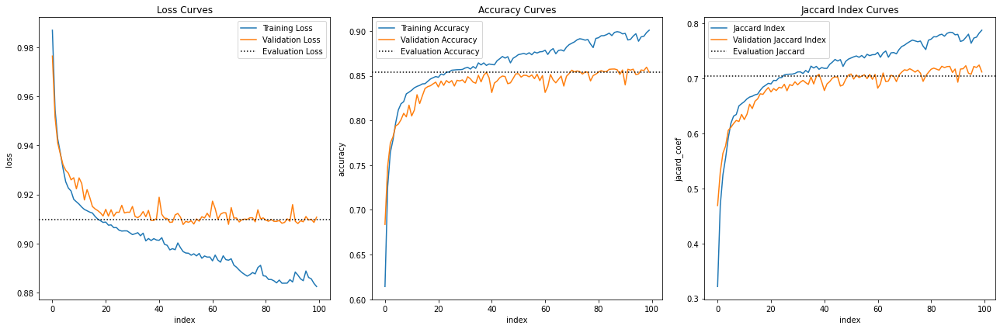

In [ ]:
# Plot the curves
plot_curves_eval(
    history_0,
    eval_acc=model_0_eval[1],
    eval_loss=model_0_eval[0],
    jacard_coef=model_0_eval[2]
)

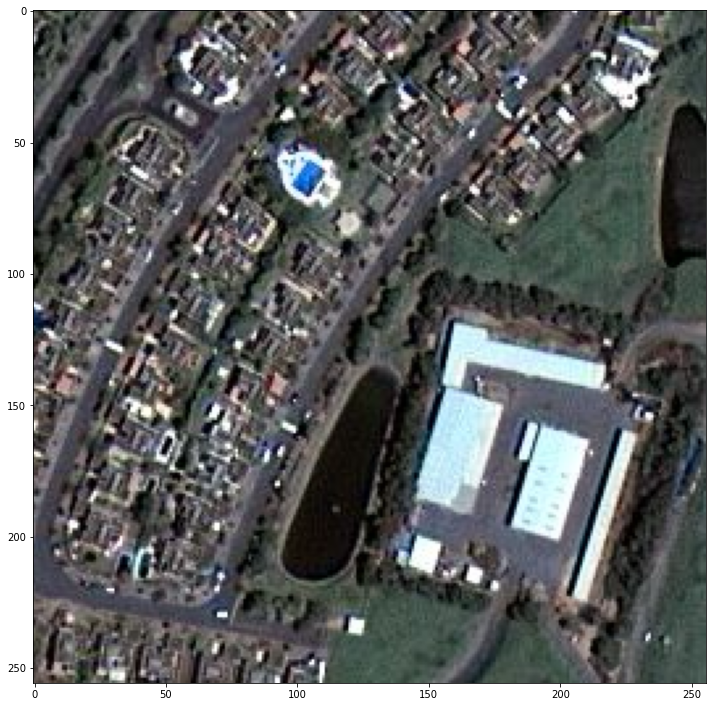

In [ ]:
plt.imshow(X_train[77])

In [ ]:
def visualize_prediction(X_example, y_example, prediction, return_imgs=False):
  fig = plt.figure(figsize=(18,6))

  ax1 = fig.add_subplot(1, 3, 1)
  ax1.imshow(X_example)

  ax2 = fig.add_subplot(1, 3, 2)
  ax2 = sns.heatmap(y_example, square=True, xticklabels=False, yticklabels=False, cbar=False)

  ax3 = fig.add_subplot(1, 3, 3)
  ax3 = sns.heatmap(prediction, square=True, xticklabels=False, yticklabels=False, cbar=False)
  plt.show()
  if return_imgs:
    return X_example, y_example, prediction

In [ ]:
X_test[1].shape

(256, 256, 3)

In [ ]:
model_0_preds = model_0.predict(X_test)

9/9 [==============================] - 0s 15ms/step


In [ ]:
model_0_preds.shape

(261, 256, 256, 6)

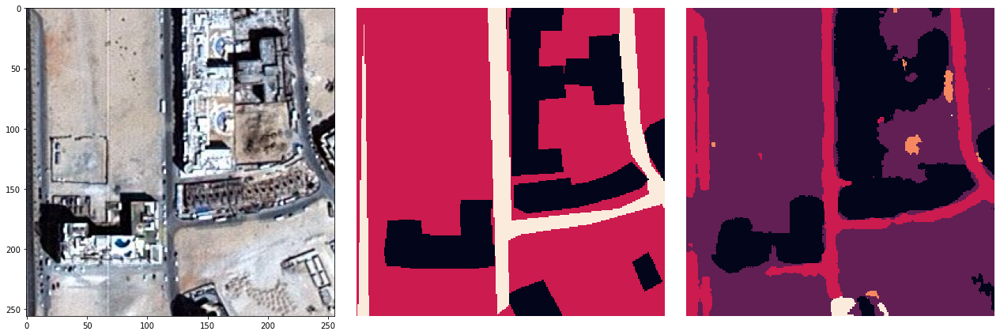

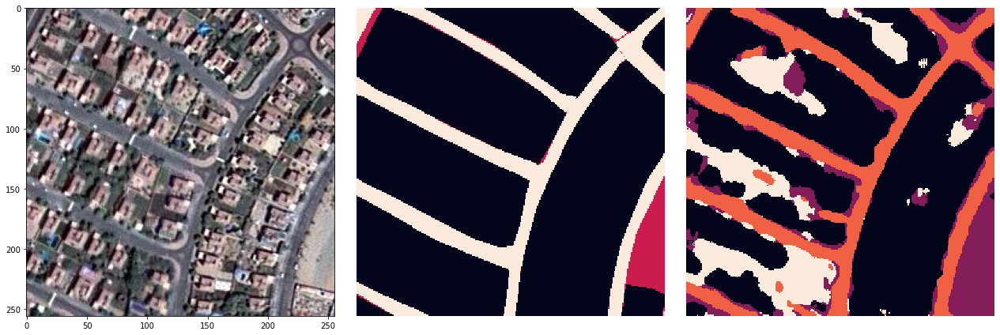

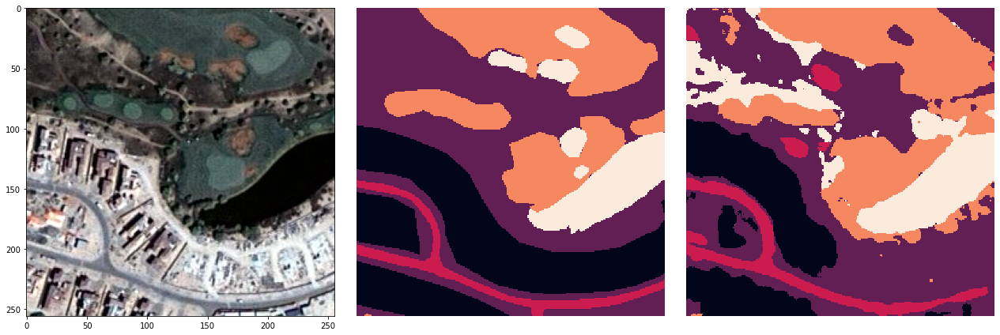

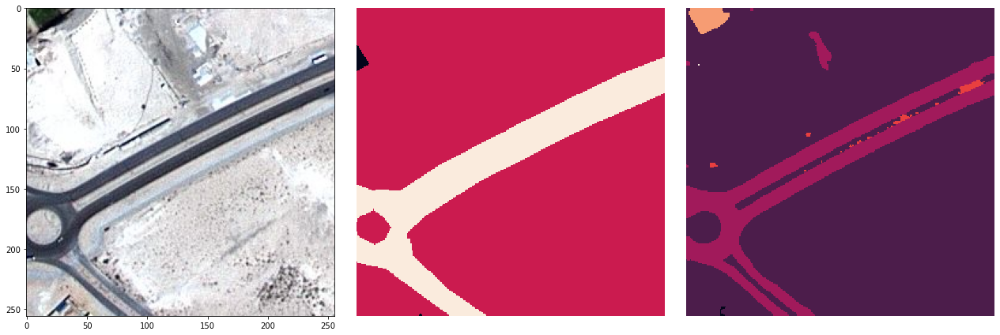

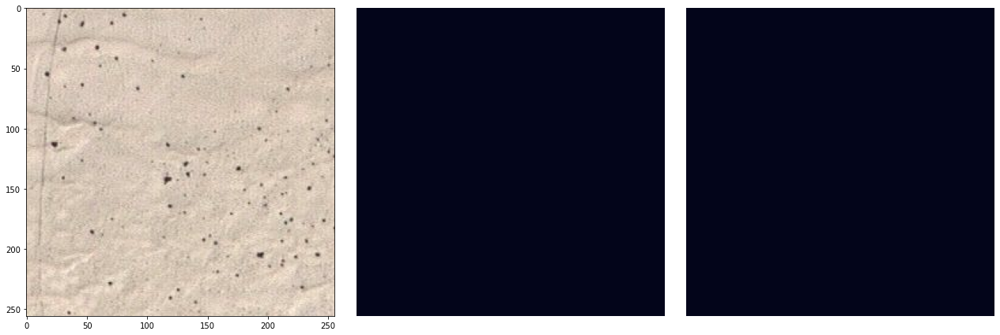

In [ ]:
# Visualize model's performance
for i in range(5):
  visualize_prediction(X_test[i], np.argmax(y_test[i], axis=2), np.argmax(model_0_preds[i], axis=2))

## 3.3. Train another model using Categorical Crossentropy as a loss function

In [ ]:
model_1 = multi_unet_model(n_classes=n_classes,
                           img_h=X_train.shape[1],
                           img_w=X_train.shape[2],
                           img_ch=X_train.shape[3])

In [ ]:
model_1.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(),
    metrics=['accuracy', jacard_coef]
)

In [ ]:
history_1 = model_1.fit(
    X_train,
    y_train,
    batch_size=16,
    epochs=100,
    validation_data=(X_test, y_test),
    shuffle=False
)

Epoch 1/100
66/66 [==============================] - 11s 53ms/step - loss: 1.1404 - accuracy: 0.5744 - jacard_coef: 0.3066 - val_loss: 0.9021 - val_accuracy: 0.6624 - val_jacard_coef: 0.3759
Epoch 2/100
66/66 [==============================] - 3s 44ms/step - loss: 0.8593 - accuracy: 0.6834 - jacard_coef: 0.4204 - val_loss: 0.8125 - val_accuracy: 0.6929 - val_jacard_coef: 0.4443
Epoch 3/100
66/66 [==============================] - 3s 43ms/step - loss: 0.7611 - accuracy: 0.7346 - jacard_coef: 0.4655 - val_loss: 0.7864 - val_accuracy: 0.7123 - val_jacard_coef: 0.4772
Epoch 4/100
66/66 [==============================] - 3s 43ms/step - loss: 0.7078 - accuracy: 0.7513 - jacard_coef: 0.4921 - val_loss: 0.7749 - val_accuracy: 0.7219 - val_jacard_coef: 0.4939
Epoch 5/100
66/66 [==============================] - 3s 43ms/step - loss: 0.6883 - accuracy: 0.7583 - jacard_coef: 0.5020 - val_loss: 0.7153 - val_accuracy: 0.7440 - val_jacard_coef: 0.5227
Epoch 6/100
66/66 [==============================

In [ ]:
# Evaluate model_1
model_1_eval = model_1.evaluate(X_test, y_test)

9/9 [==============================] - 0s 27ms/step - loss: 0.5729 - accuracy: 0.8478 - jacard_coef: 0.6858


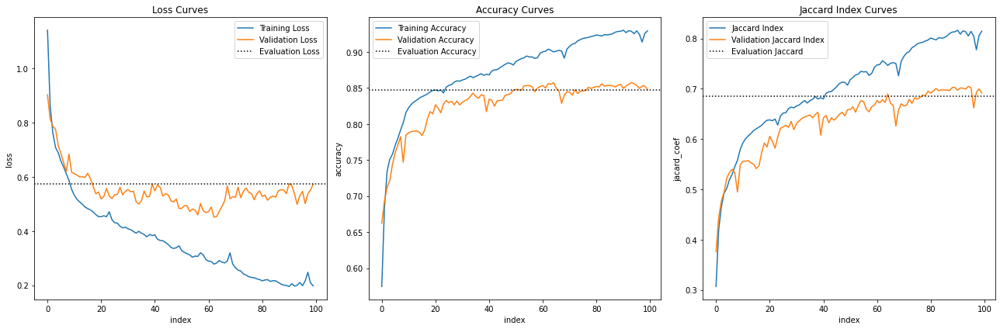

In [ ]:
# Plot the curves
plot_curves_eval(
    history_1,
    eval_acc=model_1_eval[1],
    eval_loss=model_1_eval[0],
    jacard_coef=model_1_eval[2]
)

In [ ]:
c

9/9 [==============================] - 0s 15ms/step


In [ ]:
# Yet another helper function
def visualize_compare(X_example, y_example,  *args):
  args_values = args
  fig = plt.figure(figsize=(int(12 + len(args_values) *6),6))

  ax1 = fig.add_subplot(1, int(2 +len(args_values)), 1)
  ax1.imshow(X_example)

  ax2 = fig.add_subplot(1, int(2 +len(args_values)), 2)
  ax2 = sns.heatmap(y_example, square=True, xticklabels=False, yticklabels=False, cbar=False)

  for it in range( int(len(args_values))):
    xx = fig.add_subplot(1, int(2 +len(args_values)), int(3+it))
    xx = sns.heatmap(args_values[it], square=True, xticklabels=False, yticklabels=False, cbar=False)
  plt.show()

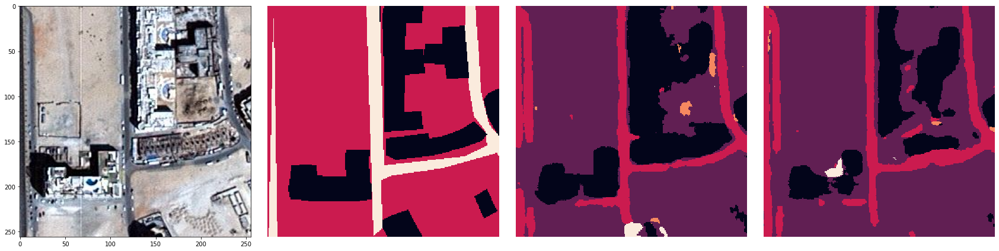

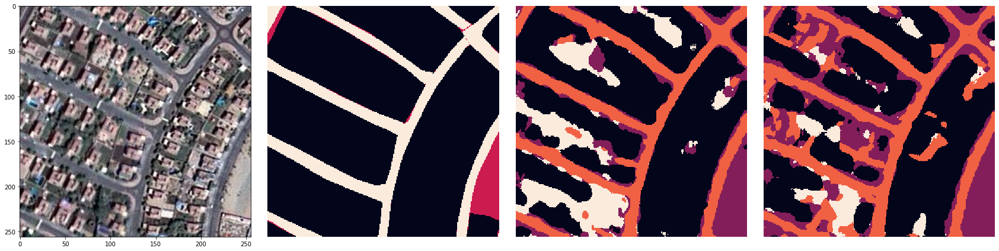

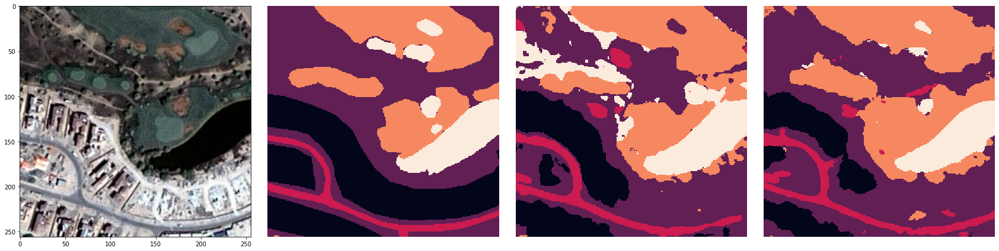

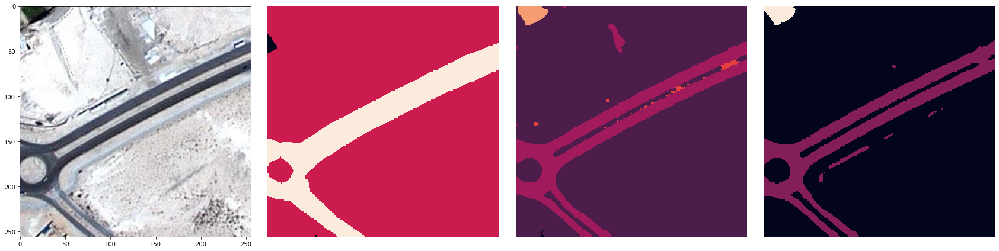

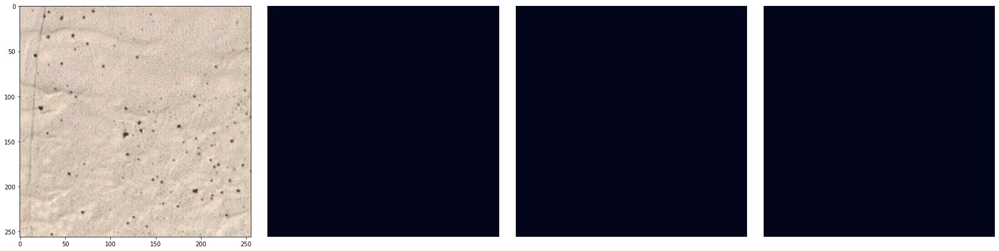

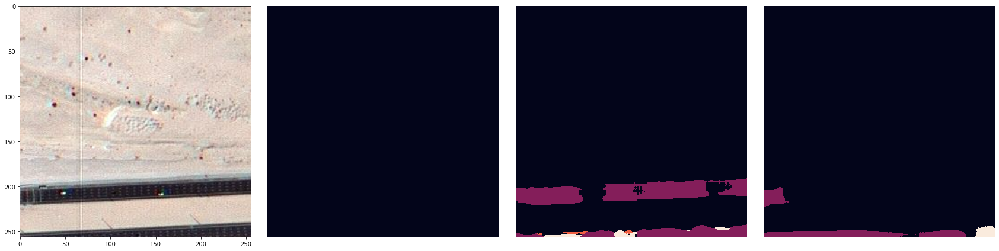

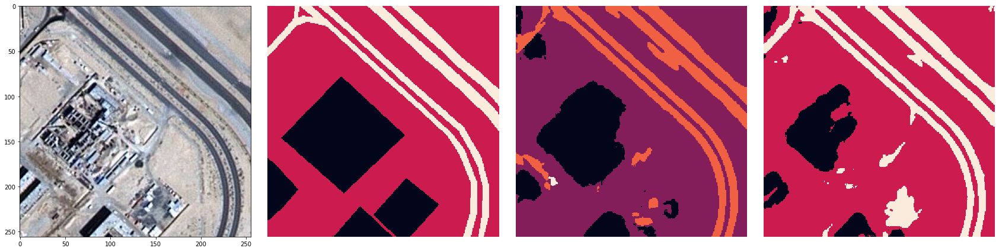

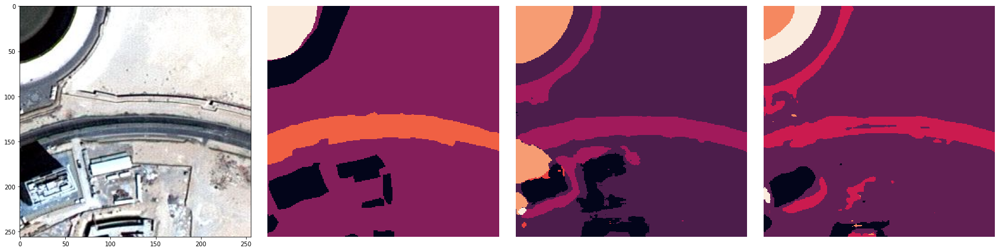

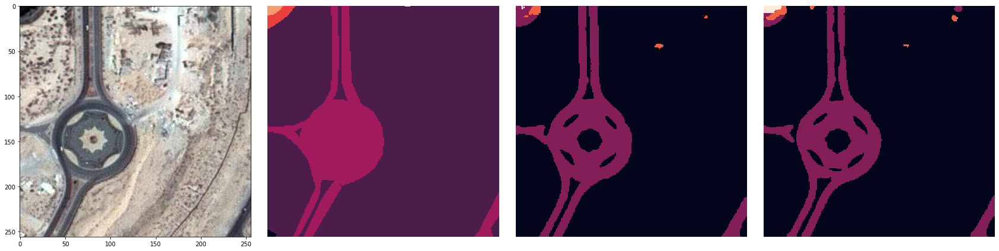

In [ ]:
# Visualize model's performance
for i in range(9):
  visualize_compare(X_test[i], np.argmax(y_test[i], axis=2), np.argmax(model_0_preds[i], axis=2), np.argmax(model_1_preds[i], axis=2))

**Looks like after all Categorical Crossentropy works better. Let's see if changing the dropout on the model will improve results.**

### Simple unet with higher dropout rate on some of the convolutions

In [ ]:
model_2 = multi_unet_model(n_classes=n_classes,
                           img_h=X_train.shape[1],
                           img_w=X_train.shape[2],
                           img_ch=X_train.shape[3],
                           dropout_rate=0.3)

In [ ]:
model_2.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(),
    metrics=['accuracy', jacard_coef]
)

In [ ]:
history_2 = model_2.fit(
    X_train,
    y_train,
    batch_size=16,
    epochs=100,
    validation_data=(X_test, y_test),
    shuffle=False
)

Epoch 1/100
66/66 [==============================] - 11s 54ms/step - loss: 1.2810 - accuracy: 0.5392 - jacard_coef: 0.2634 - val_loss: 1.0405 - val_accuracy: 0.6332 - val_jacard_coef: 0.3258
Epoch 2/100
66/66 [==============================] - 3s 43ms/step - loss: 0.9865 - accuracy: 0.6436 - jacard_coef: 0.3633 - val_loss: 0.8628 - val_accuracy: 0.6853 - val_jacard_coef: 0.4487
Epoch 3/100
66/66 [==============================] - 3s 43ms/step - loss: 0.8173 - accuracy: 0.6883 - jacard_coef: 0.4430 - val_loss: 0.8027 - val_accuracy: 0.7145 - val_jacard_coef: 0.4402
Epoch 4/100
66/66 [==============================] - 3s 43ms/step - loss: 0.7370 - accuracy: 0.7395 - jacard_coef: 0.4805 - val_loss: 0.7539 - val_accuracy: 0.7293 - val_jacard_coef: 0.4894
Epoch 5/100
66/66 [==============================] - 3s 43ms/step - loss: 0.6873 - accuracy: 0.7566 - jacard_coef: 0.5036 - val_loss: 0.8761 - val_accuracy: 0.7047 - val_jacard_coef: 0.4852
Epoch 6/100
66/66 [==============================

In [ ]:
# Evaluate model_1
model_2_eval = model_2.evaluate(X_test, y_test)

9/9 [==============================] - 0s 27ms/step - loss: 0.5313 - accuracy: 0.8446 - jacard_coef: 0.6690


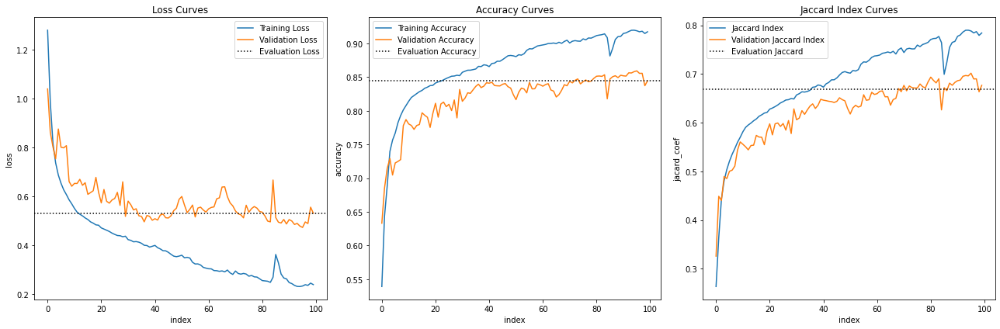

In [ ]:
# Plot the curves
plot_curves_eval(
    history_2,
    eval_acc=model_2_eval[1],
    eval_loss=model_2_eval[0],
    jacard_coef=model_2_eval[2]
)

In [ ]:
model_2_preds = model_2.predict(X_test)

9/9 [==============================] - 0s 15ms/step


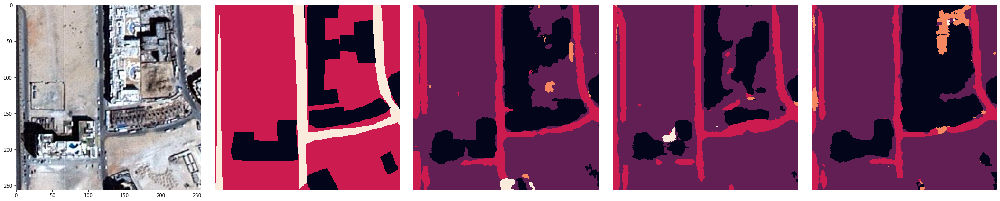

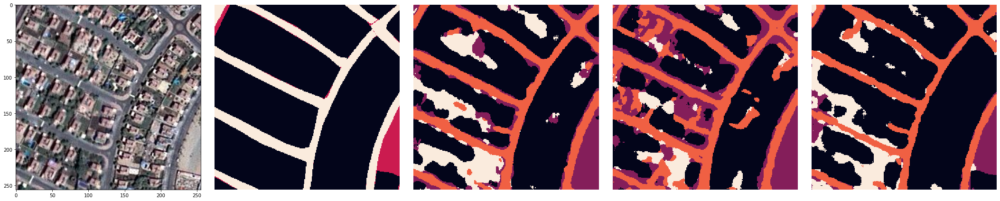

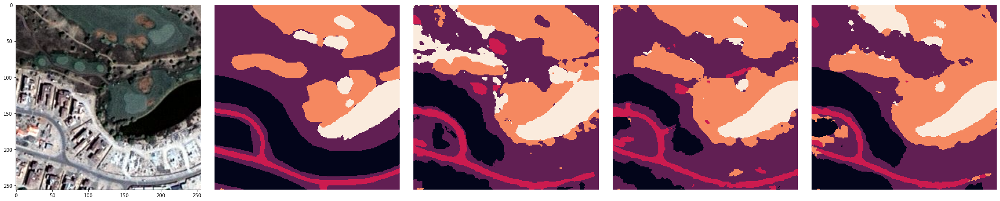

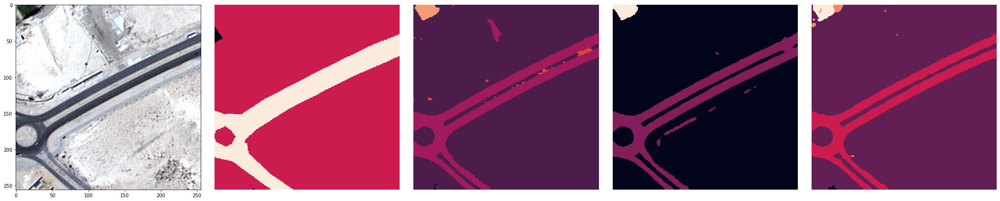

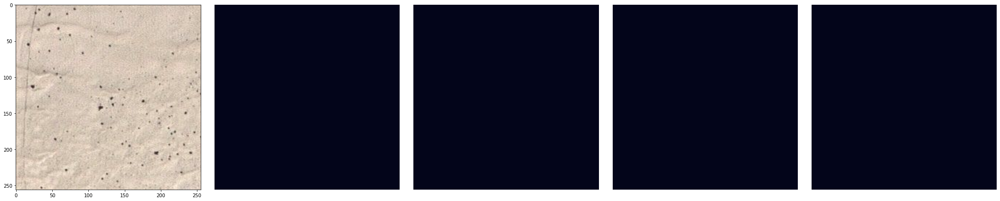

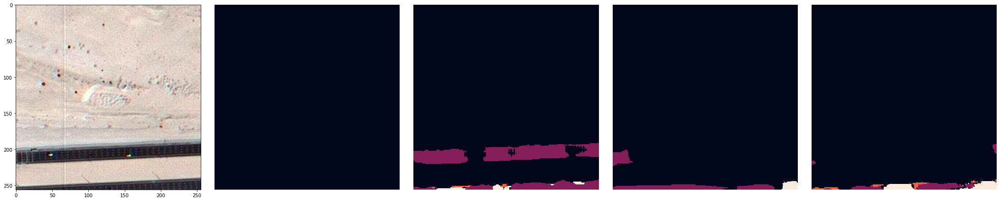

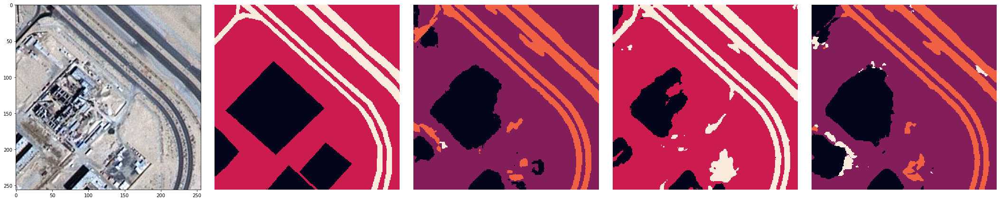

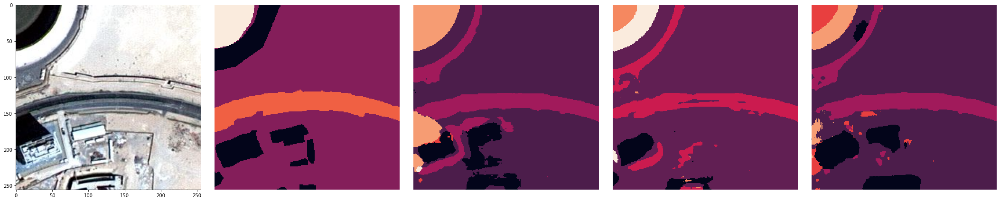

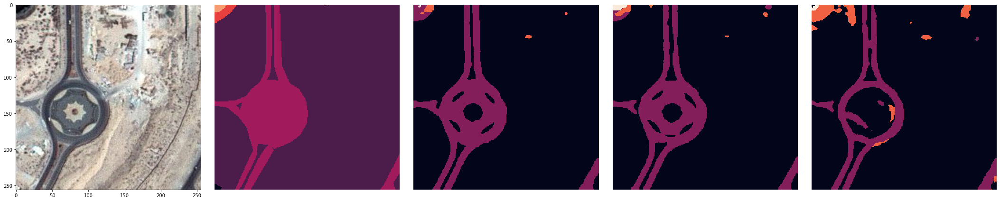

In [ ]:
# Visualize model's performance
for i in range(9):
  visualize_compare(X_test[i], np.argmax(y_test[i], axis=2), np.argmax(model_0_preds[i], axis=2), np.argmax(model_1_preds[i], axis=2), np.argmax(model_2_preds[i], axis=2) )

Next to do

https://paperswithcode.com/paper/satellite-image-semantic-segmentation